# Rainfall prediction using Linear regression


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import plotly.express as px
import plotly.graph_objects as go

from keras.src.losses import mean_absolute_error
from pandas.core.interchange.dataframe_protocol import DataFrame
from pandas.errors import EmptyDataError
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.feature_selection import chi2


In [2]:
data = pd.read_csv("Austin 2019-01-01 to 2023-07-22.csv")

In [3]:
print(data.columns)
print(data.shape)

Index(['name', 'datetime', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'preciptype', 'snow', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'severerisk', 'sunrise',
       'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'],
      dtype='object')
(1664, 33)


In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
tempmax,1664.0,80.871094,15.074327,22.6,71.500,82.50,92.800,107.900
tempmin,1664.0,60.095012,14.748907,8.2,47.900,62.95,73.700,82.900
temp,1664.0,69.791827,14.351736,15.7,58.900,71.90,82.300,92.300
feelslikemax,1664.0,82.424700,17.125754,12.8,71.500,83.00,97.525,117.000
feelslikemin,1664.0,59.345012,16.120580,-7.1,46.200,62.95,73.700,90.700
feelslike,1664.0,70.424519,16.284259,4.0,58.775,71.85,84.300,99.300
dew,1664.0,55.555168,15.161742,-0.7,44.175,60.65,68.600,76.500
humidity,1664.0,64.579567,13.449047,18.4,56.100,65.10,73.625,97.900
precip,1664.0,0.084632,0.304253,0.0,0.000,0.00,0.004,3.369
precipprob,1664.0,28.245192,45.032733,0.0,0.000,0.00,100.000,100.000


In [5]:
new_data = data.drop(['datetime','name','preciptype' , 'severerisk' , 'snowdepth','snow','conditions','sunrise','sunset', 'description', 'icon','stations'],axis=1)
new_data.columns

Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'moonphase'],
      dtype='object')

In [6]:
df = pd.DataFrame(new_data)
df.head()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase
0,45.1,39.4,42.6,43.6,34.8,38.2,36.6,79.6,0.001,100,...,25.3,13.9,359.6,1022.5,65.1,8.5,46.5,4.0,2,0.85
1,40.3,36.2,37.7,34.4,29.1,31.9,35.1,90.2,2.275,100,...,20.8,10.8,349.0,1021.5,90.7,4.5,8.5,0.7,0,0.88
2,51.8,34.7,40.9,51.8,31.0,37.6,35.6,82.6,0.242,100,...,18.1,9.9,313.3,1017.8,53.2,7.4,88.9,7.6,5,0.92
3,65.9,32.5,46.2,65.9,29.1,45.1,32.9,64.8,0.000,0,...,NaN,7.8,312.5,1018.3,2.2,8.9,142.8,12.4,6,0.95
4,73.7,37.5,52.3,73.7,36.2,52.2,35.5,58.6,0.000,0,...,NaN,8.9,217.8,1020.5,0.5,9.9,144.9,12.7,6,0.00


In [7]:
new_data = new_data.replace("T",0.0)
new_data = new_data.replace("-",0.0)
print(new_data.shape)
new_data.info()

(1664, 21)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1664 entries, 0 to 1663
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tempmax           1664 non-null   float64
 1   tempmin           1664 non-null   float64
 2   temp              1664 non-null   float64
 3   feelslikemax      1664 non-null   float64
 4   feelslikemin      1664 non-null   float64
 5   feelslike         1664 non-null   float64
 6   dew               1664 non-null   float64
 7   humidity          1664 non-null   float64
 8   precip            1664 non-null   float64
 9   precipprob        1664 non-null   int64  
 10  precipcover       1664 non-null   float64
 11  windgust          1453 non-null   float64
 12  windspeed         1664 non-null   float64
 13  winddir           1664 non-null   float64
 14  sealevelpressure  1664 non-null   float64
 15  cloudcover        1664 non-null   float64
 16  visibility        1664 non-null

In [8]:
new_data.head()


,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase
0,45.1,39.4,42.6,43.6,34.8,38.2,36.6,79.6,0.001,100,...,25.3,13.9,359.6,1022.5,65.1,8.5,46.5,4.0,2,0.85
1,40.3,36.2,37.7,34.4,29.1,31.9,35.1,90.2,2.275,100,...,20.8,10.8,349.0,1021.5,90.7,4.5,8.5,0.7,0,0.88
2,51.8,34.7,40.9,51.8,31.0,37.6,35.6,82.6,0.242,100,...,18.1,9.9,313.3,1017.8,53.2,7.4,88.9,7.6,5,0.92
3,65.9,32.5,46.2,65.9,29.1,45.1,32.9,64.8,0.000,0,...,NaN,7.8,312.5,1018.3,2.2,8.9,142.8,12.4,6,0.95
4,73.7,37.5,52.3,73.7,36.2,52.2,35.5,58.6,0.000,0,...,NaN,8.9,217.8,1020.5,0.5,9.9,144.9,12.7,6,0.00


In [9]:
new_data.columns


Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'moonphase'],
      dtype='object')

EDA

In [10]:
numlist = new_data.columns


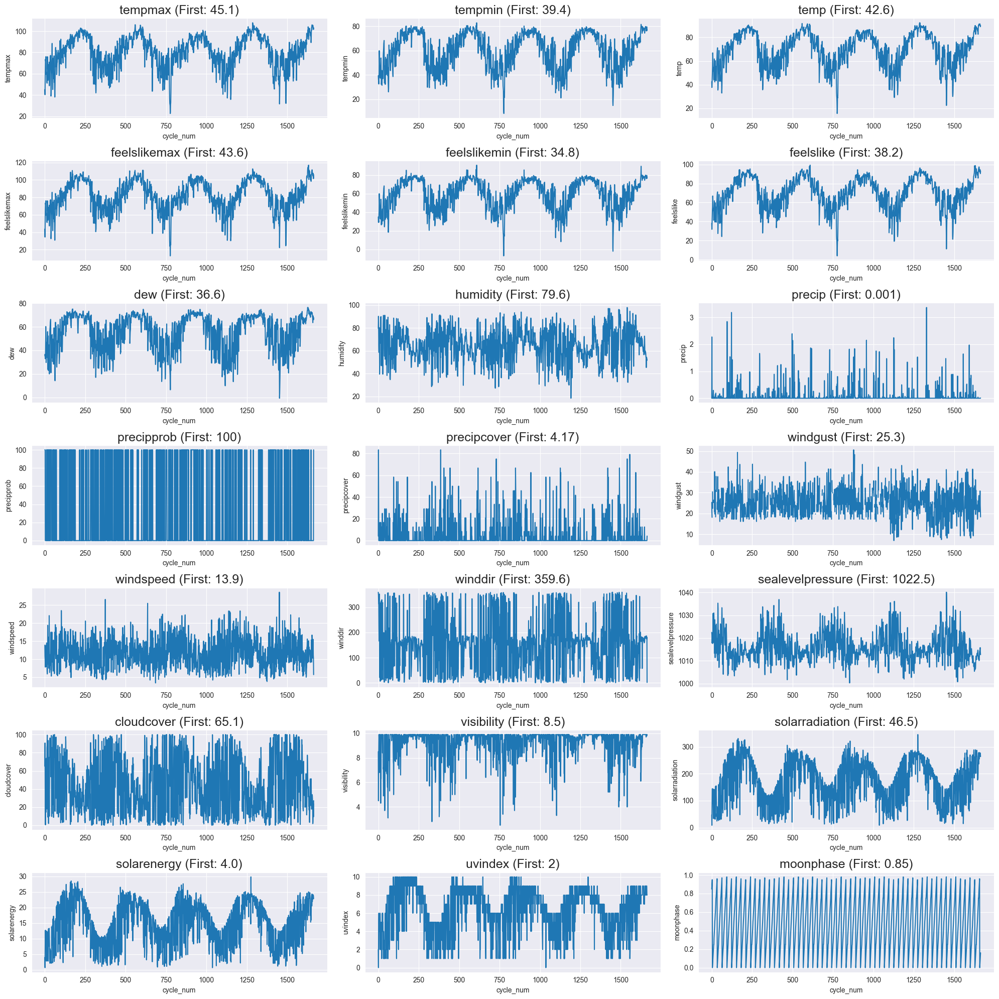

In [11]:
n_columns = len(numlist)

cols = 3
rows = math.ceil(n_columns / 3)

fig = plt.figure(figsize=(20, 20))
for i, col in enumerate(numlist):
    plt.subplot(rows, cols, i + 1)
    plt.title(col, fontsize=20)
    plt.plot(df[col])
    first_val = df[col].iloc[0]
    plt.title(f"{col} (First: {first_val})", fontsize=18)
    plt.xlabel("cycle_num")
    plt.ylabel(col)

plt.tight_layout()
plt.show()


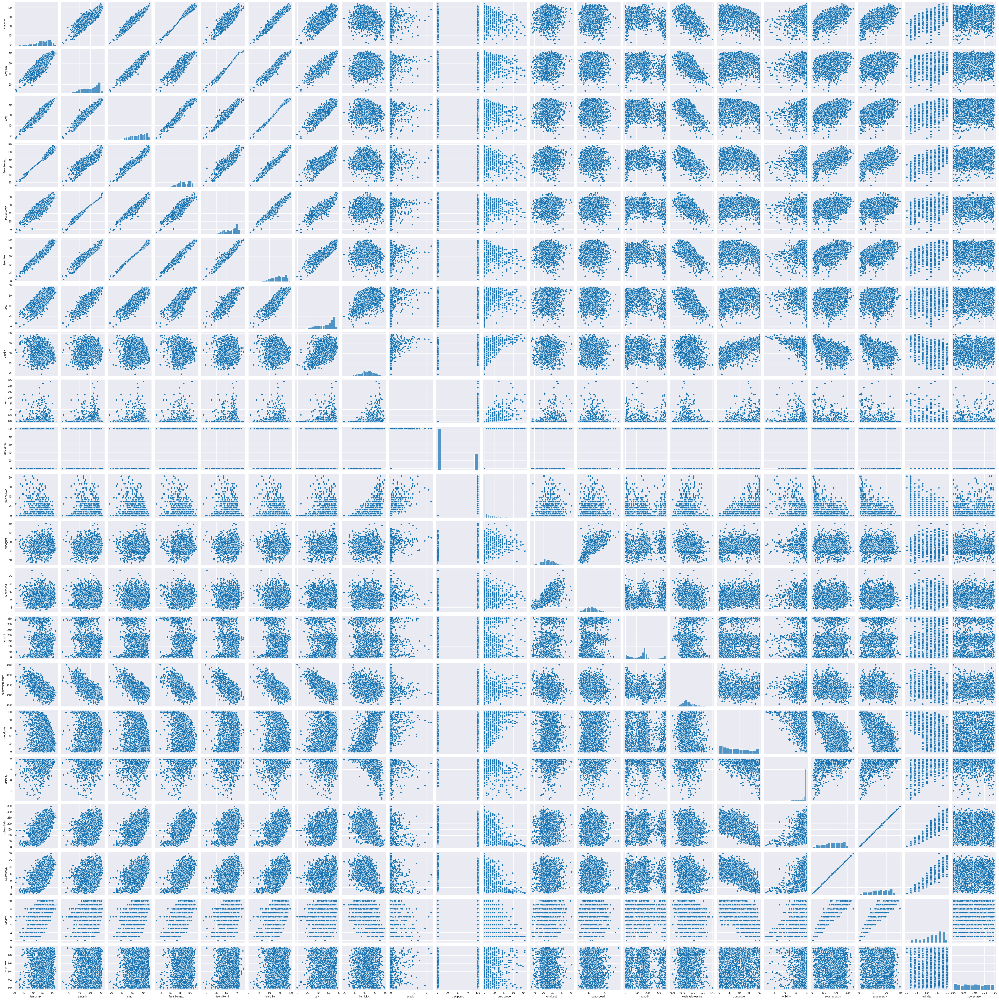

In [12]:
sns.pairplot(new_data)

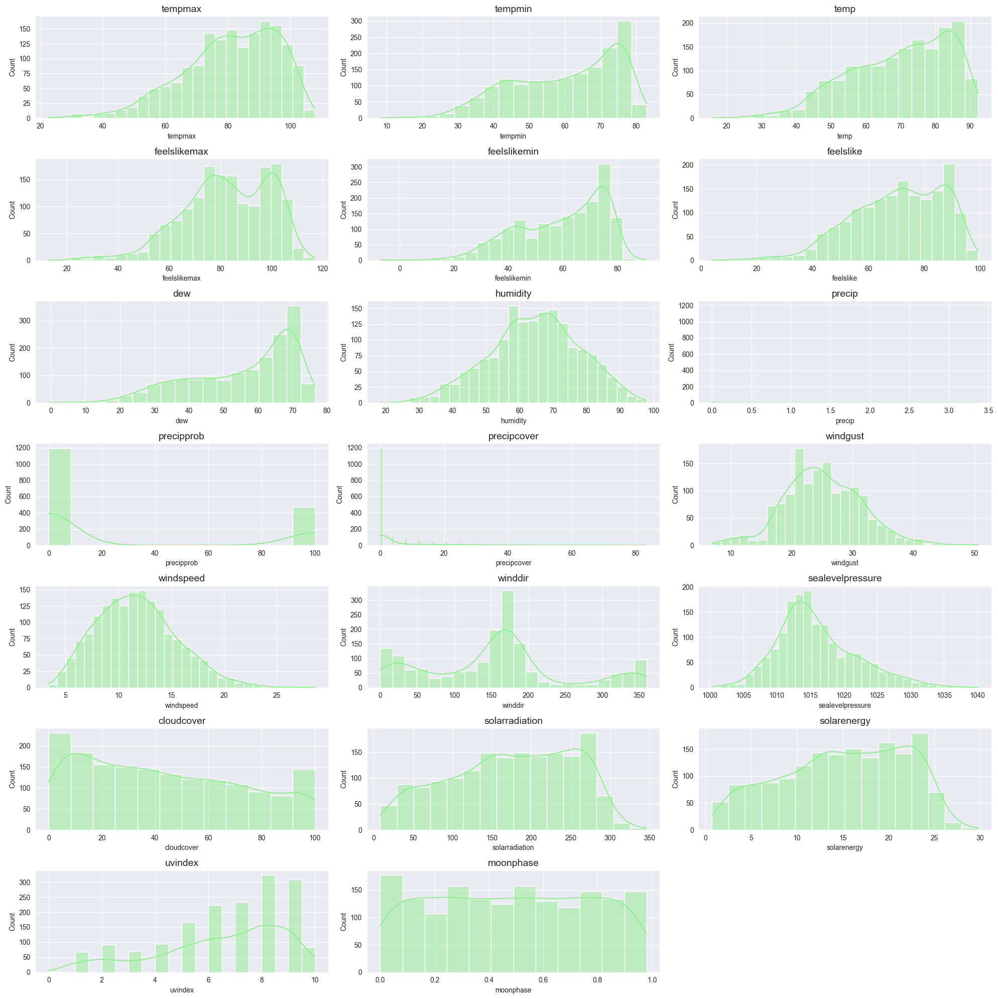

In [13]:
df_clu = [ 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'windgust', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'solarradiation', 'solarenergy', 'uvindex', 'moonphase']

n = len(df_clu)
ncols = 3  # plots per row
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 20))
axes = axes.flatten()

for i, col in enumerate(df_clu):
    sns.histplot(df[col], ax=axes[i], kde=True, color="lightgreen")
    axes[i].set_title(col, fontsize=14)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()



In [14]:
corrma = new_data.corr()
plt.figure(figsize=(10,10))

plt.show()

<Figure size 1000x1000 with 0 Axes>

In [15]:
from sklearn.preprocessing import LabelEncoder

new_data_encoded = new_data.copy()
for col in new_data.select_dtypes(include=['object']).columns:
    new_data_encoded[col] = LabelEncoder().fit_transform(new_data[col])

corrma = new_data_encoded.corr()


<Axes: >

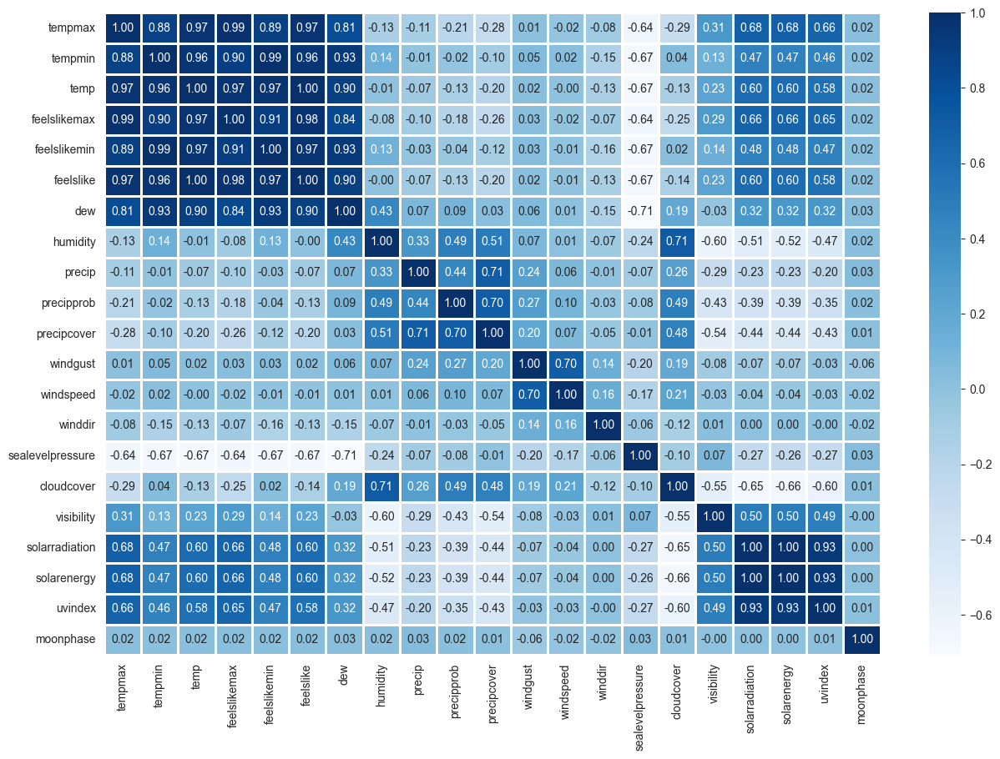

In [16]:
corrmat = new_data.corr()
plt.figure(figsize=(15,10))
sns.heatmap(
    corrmat,
    annot=True,
    cmap="Blues",
    fmt=".2f",
    linewidths=0.8,
    cbar=True

)

# Data Preprocessing / Feature Selection

In [17]:
features =new_data.iloc[:,0:8]
target = new_data.iloc[:,8]


In [18]:
new_data.head()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase
0,45.1,39.4,42.6,43.6,34.8,38.2,36.6,79.6,0.001,100,...,25.3,13.9,359.6,1022.5,65.1,8.5,46.5,4.0,2,0.85
1,40.3,36.2,37.7,34.4,29.1,31.9,35.1,90.2,2.275,100,...,20.8,10.8,349.0,1021.5,90.7,4.5,8.5,0.7,0,0.88
2,51.8,34.7,40.9,51.8,31.0,37.6,35.6,82.6,0.242,100,...,18.1,9.9,313.3,1017.8,53.2,7.4,88.9,7.6,5,0.92
3,65.9,32.5,46.2,65.9,29.1,45.1,32.9,64.8,0.000,0,...,NaN,7.8,312.5,1018.3,2.2,8.9,142.8,12.4,6,0.95
4,73.7,37.5,52.3,73.7,36.2,52.2,35.5,58.6,0.000,0,...,NaN,8.9,217.8,1020.5,0.5,9.9,144.9,12.7,6,0.00


In [19]:
X = features
y = target

In [20]:
X

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity
0,45.1,39.4,42.6,43.6,34.8,38.2,36.6,79.6
1,40.3,36.2,37.7,34.4,29.1,31.9,35.1,90.2
2,51.8,34.7,40.9,51.8,31.0,37.6,35.6,82.6
3,65.9,32.5,46.2,65.9,29.1,45.1,32.9,64.8
4,73.7,37.5,52.3,73.7,36.2,52.2,35.5,58.6
...,...,...,...,...,...,...,...,...
1659,105.1,77.6,91.4,107.2,77.6,94.3,67.6,51.5
1660,103.8,77.6,90.7,107.6,77.6,94.6,69.3,54.3
1661,103.2,79.6,90.4,104.8,79.6,93.7,68.3,53.3
1662,101.6,76.4,89.0,101.5,76.4,90.4,66.0,52.9


# Model Training

In [21]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [22]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

# Example pipeline (scaler + model placeholder)
pipeline = Pipeline([
    ('scaler', StandardScaler()),   # Preprocessing step (scales features)
    ('model', None)                 # Placeholder for model, will set later
])
pipeline.fit(X_train, y_train)

,steps,"[('scaler', ...), ('model', ...)]"
,transform_input,None
,memory,None
,verbose,False
,copy,True
,with_mean,True
,with_std,True


#  Model Evaluation

In [23]:
y_pred = model.predict(X_test)

# Prediction and Visualziing Results

In [24]:
model = LinearRegression()

# Train (fit) the model
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate performance
# mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Linear Regression Results")
#print(f"MAE  : {mse:.3f}")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

Linear Regression Results
MSE  : 0.048
RMSE : 0.220
R²   : 0.190


## Use pipeline

In [25]:
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', LinearRegression())
])

# Train pipeline
pipeline.fit(X_train, y_train)

# Predictions
y_pred = pipeline.predict(X_test)

# Evaluate performance
#mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Linear Regression Results (using Pipeline)")
#print(f"MAE  : {mae:.3f}")
print(f"MSE  : {mse:.3f}")
print(f"RMSE : {rmse:.3f}")
print(f"R²   : {r2:.3f}")

Linear Regression Results (using Pipeline)
MSE  : 0.048
RMSE : 0.220
R²   : 0.190


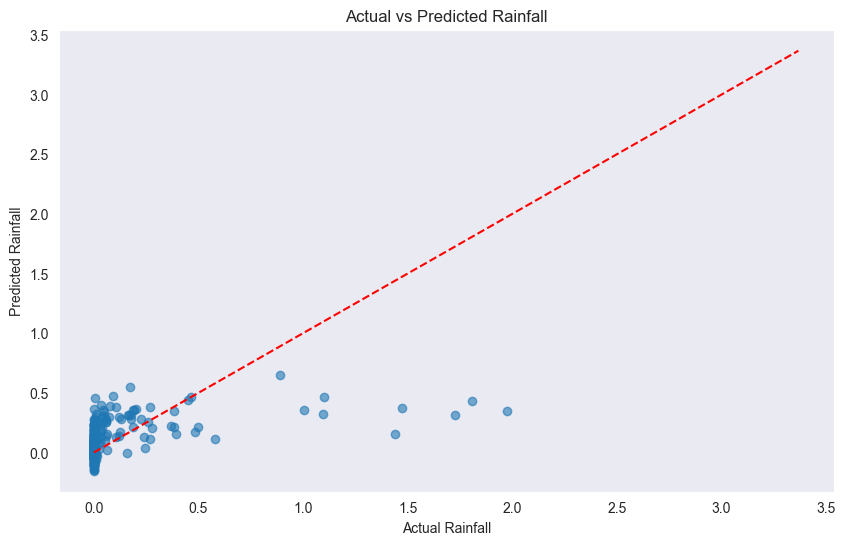

In [26]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linestyle='--')
plt.title('Actual vs Predicted Rainfall')
plt.xlabel('Actual Rainfall')
plt.ylabel('Predicted Rainfall')
plt.grid()
plt.show()


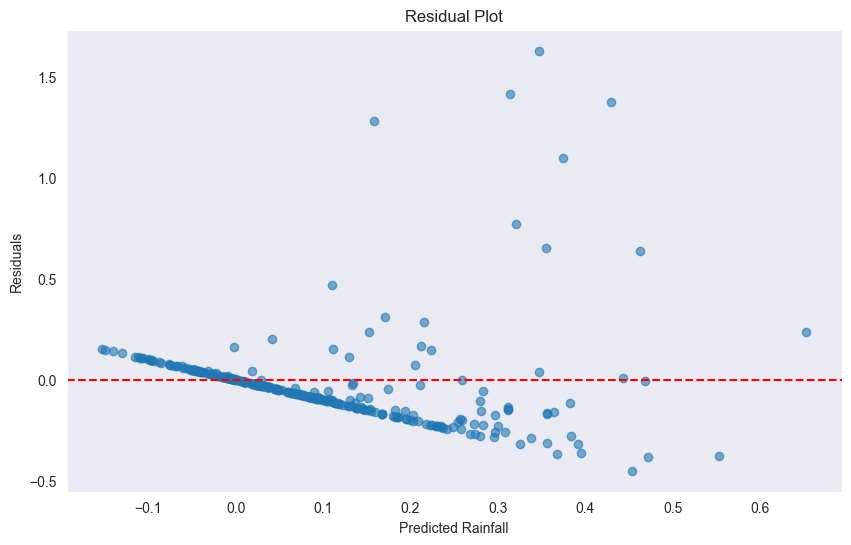

In [27]:
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, residuals, alpha=0.6)
plt.axhline(y=0, color='red', linestyle='--')
plt.title('Residual Plot')
plt.xlabel('Predicted Rainfall')
plt.ylabel('Residuals')
plt.grid()
plt.show()

In [38]:
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# Create grid for temp and humidity
temp_range = np.linspace(new_data["temp"].min(), new_data["temp"].max(), 30)
humidity_range = np.linspace(new_data["humidity"].min(), new_data["humidity"].max(), 30)
temp_grid, humidity_grid = np.meshgrid(temp_range, humidity_range)

# Prepare full feature matrix (use mean for other variables)
X_grid = np.c_[
    temp_grid.ravel(),
    humidity_grid.ravel(),
    np.full(temp_grid.size, new_data["tempmax"].mean()),
    np.full(temp_grid.size, new_data["tempmin"].mean()),
    np.full(temp_grid.size, new_data["feelslikemax"].mean()),
    np.full(temp_grid.size, new_data["feelslikemin"].mean()),
    np.full(temp_grid.size, new_data["feelslike"].mean()),
    np.full(temp_grid.size, new_data["dew"].mean())
]

# Predict precip on the grid
precip_pred = model.predict(X_grid)
precip_grid = precip_pred.reshape(temp_grid.shape)

# Base 3D scatter plot
fig = px.scatter_3d(
    new_data,
    x="temp",
    y="humidity",
    z="precip",
    color="precip",
    opacity=0.8,
    hover_data=["tempmax", "tempmin", "feelslikemax", "feelslikemin", "feelslike", "dew"]
)

# Add regression surface
fig.add_trace(go.Surface(
    x=temp_range,
    y=humidity_range,
    z=precip_grid,
    colorscale="Viridis",
    opacity=0.5,
    showscale=False,
    name="Regression model"
))

fig.show()

# Save
fig.write_html("3d_regression plot.html")
fig.write_image("3d_regression_plot.pdf")


D:\ML_project\Rainfall prediction using Linear regression\.venv\Lib\site-packages\sklearn\utils\validation.py:2749: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names

